In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
from torchvision import models, transforms, datasets
from torchvision.models import resnet34, ResNet34_Weights, resnet34, ResNet34_Weights, densenet121, DenseNet121_Weights, squeezenet1_1, SqueezeNet1_1_Weights, resnet50, ResNet50_Weights
from torch.utils.data import DataLoader, Sampler
from AdaIN import AdaIN
import pandas as pd

In [2]:
def analysis(model,cNum,sNum):
    style = f"Test/Style/Style-{sNum}.jpg"
    content = f"Test/Content/Content-{cNum}.jpg"

    model.fit(content,[style])
    
    model.pipeline()
    
    model.displayImages()

    score = model.evaluate()
    print(score)
    return score

## Default VGG-19 Baseline

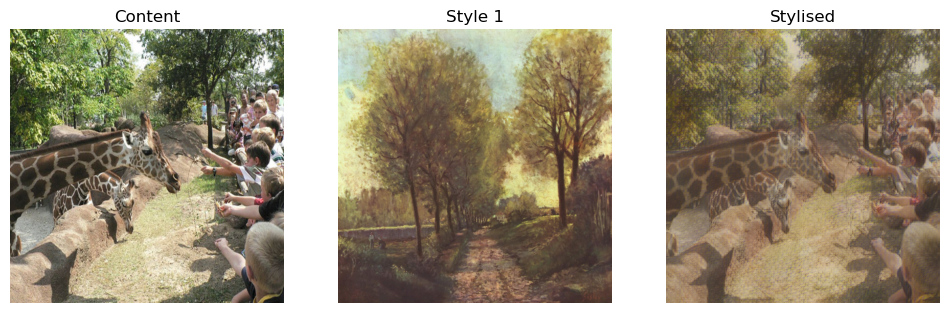

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.409, 419.5402089972049)


In [4]:
prebuildEncoder = "Model/vgg.pth"
prebuildDecoder = "Model/default.pth_5.pth" #Use content to style ratio of 1:1 version for fair comparision

defaultAdaIN = AdaIN(prebuildEncoder, prebuildDecoder)
defaultAdaIN.setup()
defaultScore1,defaultSpeed1 = analysis(defaultAdaIN,1,1)

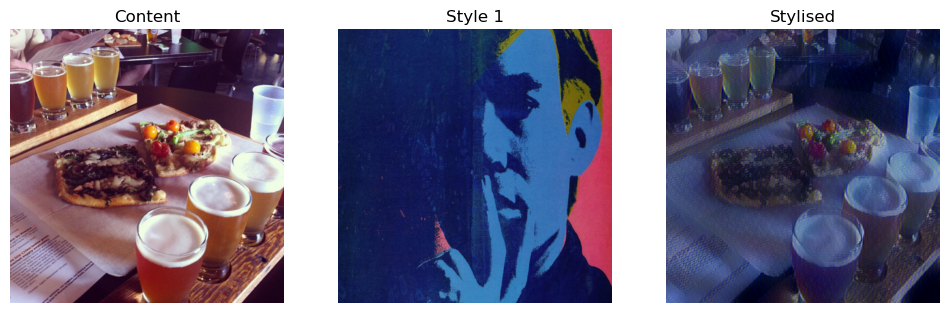

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.514, 207.27258300757967)


In [5]:
defaultScore2,defaultSpeed2 = analysis(defaultAdaIN,2,2)

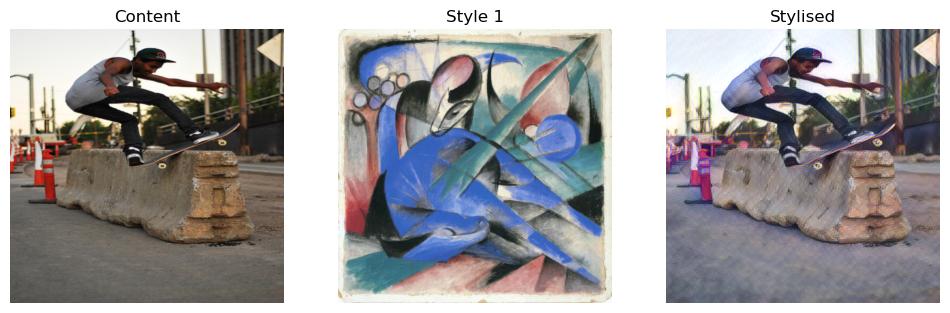

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.275, 216.78083299775608)


In [6]:
defaultScore3,defaultSpeed3 = analysis(defaultAdaIN,3,3)

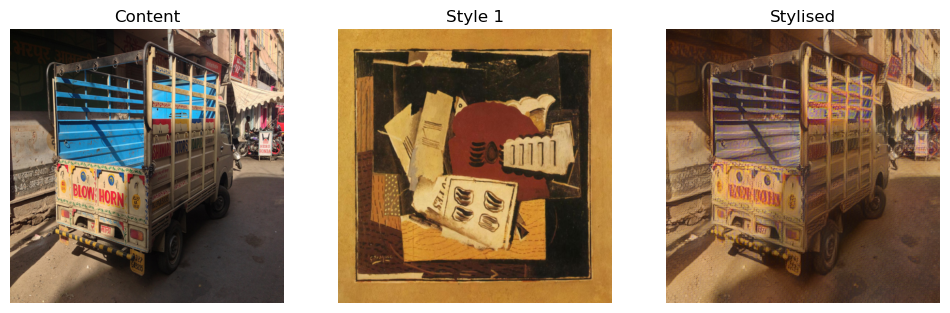

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.26, 217.09824999561533)


In [7]:
defaultScore4,defaultSpeed4 = analysis(defaultAdaIN,4,4)

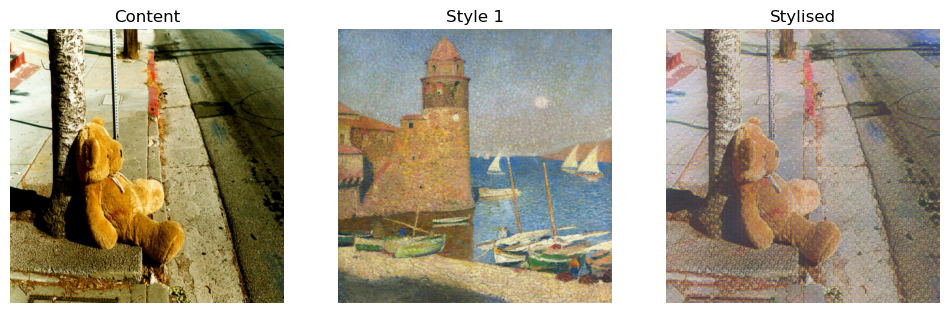

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.464, 198.75804198090918)


In [8]:
defaultScore5,defaultSpeed5 = analysis(defaultAdaIN,5,5)

## Res50

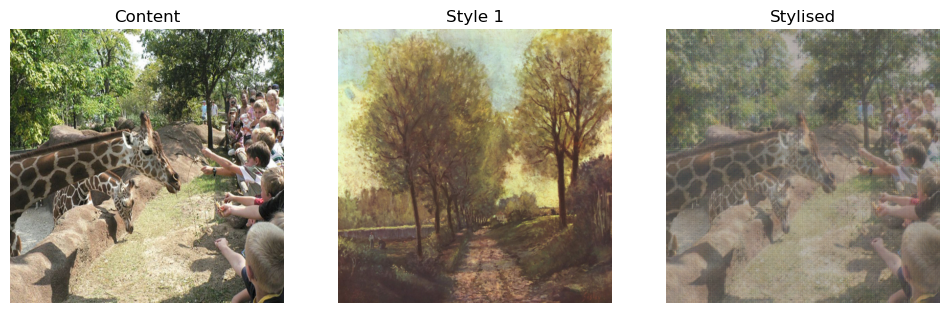

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.427, 184.15329200797714)


In [10]:
res50Decoder_prebuild = "Model/resnet-model-layer2.pth"
resnet = resnet50(weights=ResNet50_Weights.DEFAULT)
res50Encoder = nn.Sequential(*list(resnet.children())[:6])

res50AdaIN = AdaIN(prebuild_decoder = res50Decoder_prebuild)
res50AdaIN.uploadEncoder(res50Encoder)
res50AdaIN.loadPrebuildDecoder()
res50AdaIN.setup()
res50Score1,res50Speed1 = analysis(res50AdaIN,1,1)

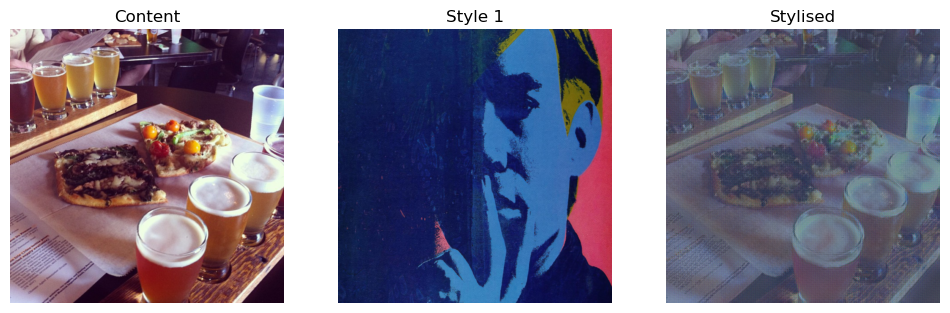

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.441, 164.94745897944085)


In [11]:
res50Score2,res50Speed2 = analysis(res50AdaIN,2,2)

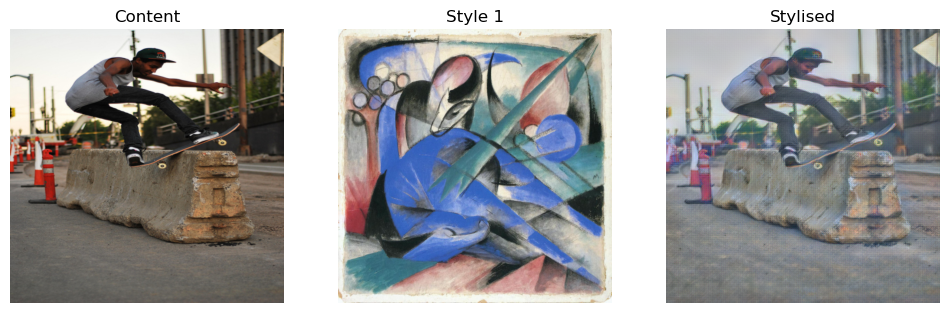

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.285, 159.05687501071952)


In [12]:
res50Score3,res50Speed3 = analysis(res50AdaIN,3,3)

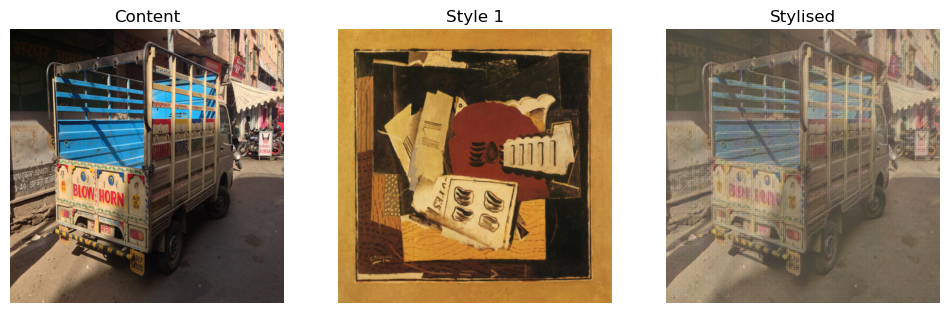

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.292, 156.4220410073176)


In [13]:
res50Score4,res50Speed4 = analysis(res50AdaIN,4,4)

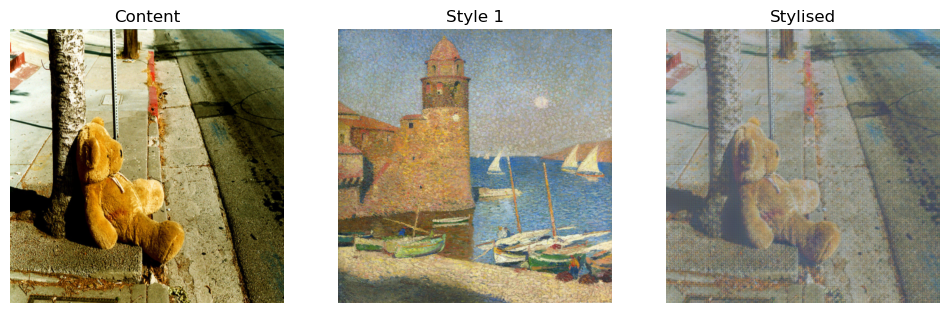

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.457, 156.26541699748486)


In [14]:
res50Score5,res50Speed5 = analysis(res50AdaIN,5,5)

## Res34

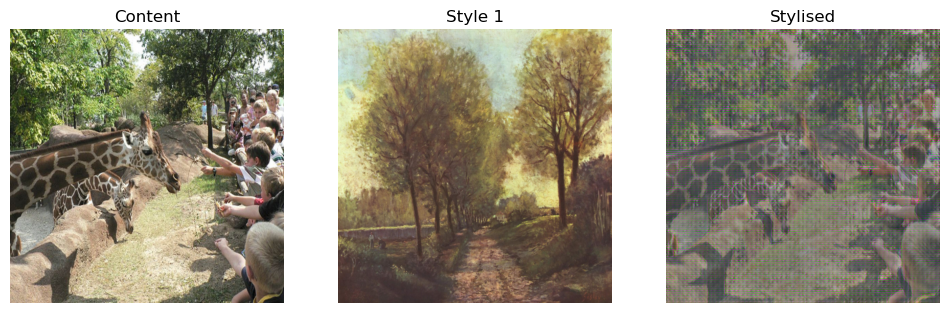

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.587, 113.08995797298849)


In [16]:
res34Decoder_prebuild = "Model/resnet34_layer2_5.pth"
resnet34 = resnet34(weights=ResNet34_Weights.DEFAULT)
res34Encoder = nn.Sequential(*list(resnet34.children())[:6])

res34Decoder = nn.Sequential(    
            nn.ReflectionPad2d(1),
            nn.Conv2d(128, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),

            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 128, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(128, 128, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(128, 64, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(64, 64, 3),
            nn.ReLU(inplace=True),

            
            nn.ReflectionPad2d(1),
            nn.Conv2d(64, 3, 3),
    
        )

res34AdaIN = AdaIN(prebuild_decoder = res34Decoder_prebuild)
res34AdaIN.uploadEncoder(res34Encoder)
res34AdaIN.uploadDecoder(res34Decoder)
res34AdaIN.setup()
res34Score1,res34Speed1 = analysis(res34AdaIN,1,1)

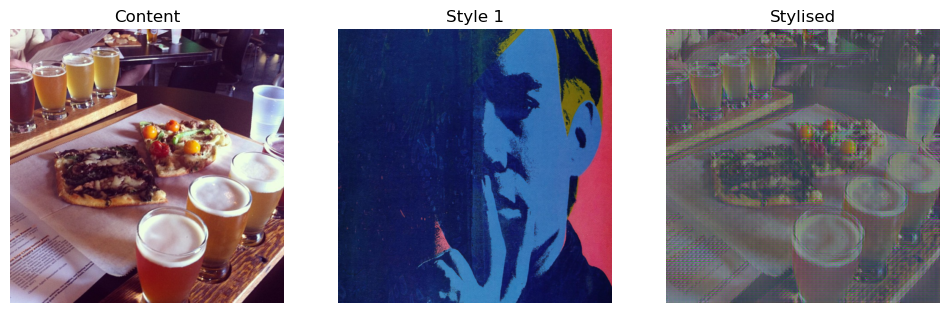

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.609, 109.49183302000165)


In [17]:
res34Score2,res34Speed2 = analysis(res34AdaIN,2,2)

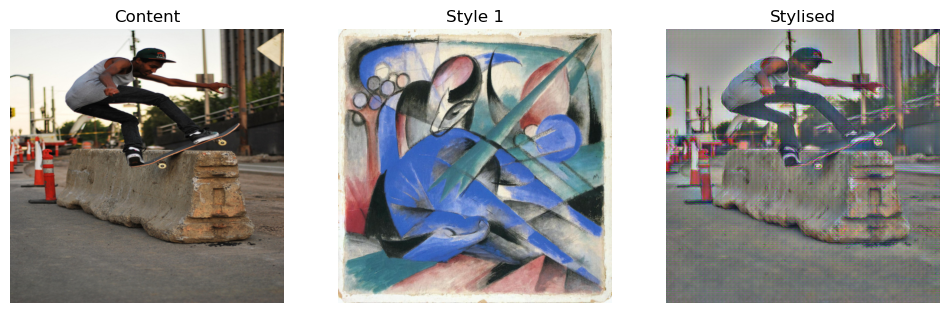

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.376, 115.27829201077111)


In [18]:
res34Score3,res34Speed3 = analysis(res34AdaIN,3,3)

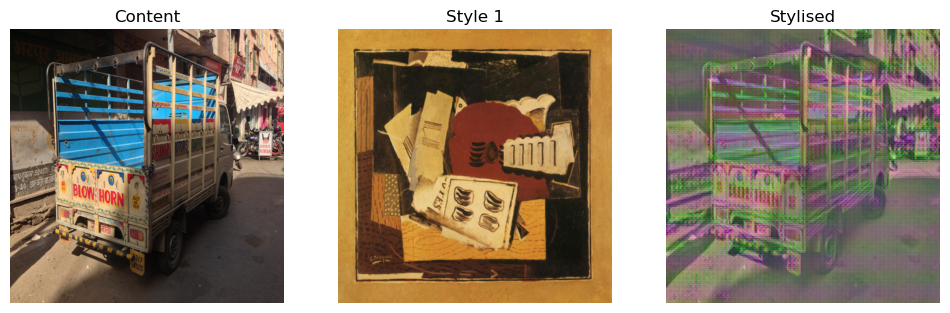

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.413, 106.91758402390406)


In [19]:
res34Score4,res34Speed4 = analysis(res34AdaIN,4,4)

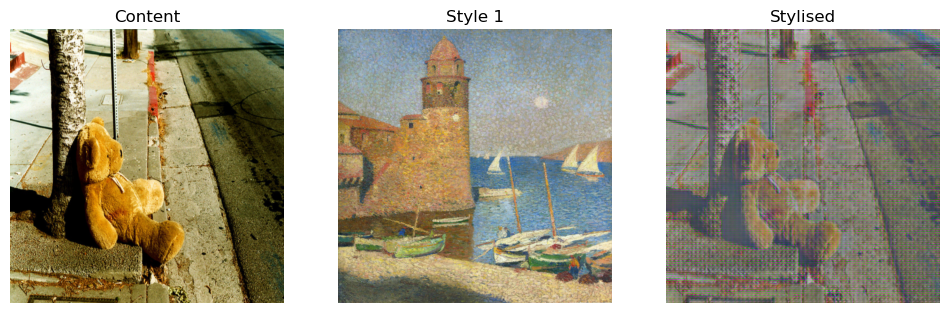

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.626, 115.48904198571108)


In [20]:
res34Score5,res34Speed5 = analysis(res34AdaIN,5,5)

## SqueezeNet

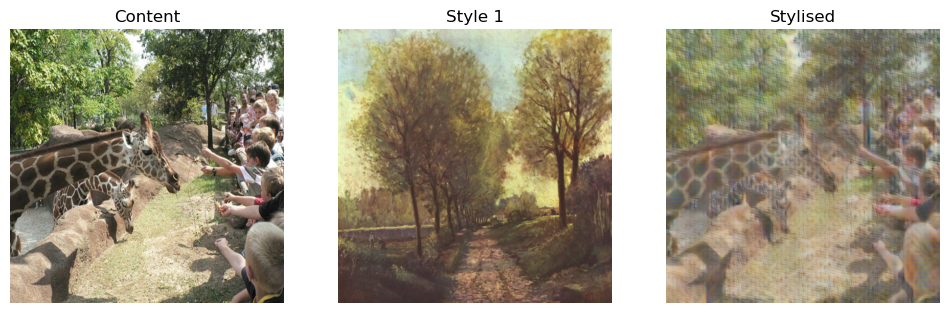

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.644, 137.67629099311307)


In [22]:
sn = squeezenet1_1(weights = SqueezeNet1_1_Weights.DEFAULT)
squeezeEncoder = nn.Sequential(*list(sn.features.children())[:7])

squeezeDecoder = nn.Sequential(    
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),

            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 128, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(128, 128, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(128, 64, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(64, 64, 3),
            nn.ReLU(inplace=True),

            
            nn.ReflectionPad2d(1),
            nn.Conv2d(64, 3, 3),
        )

snAdaIN = AdaIN(prebuild_decoder= "Model/squeeze_3_5.pth")
snAdaIN.uploadEncoder(squeezeEncoder)
snAdaIN.uploadDecoder(squeezeDecoder)
snAdaIN.setup()

squeezeScore1,squeezeSpeed1 = analysis(snAdaIN,1,1)

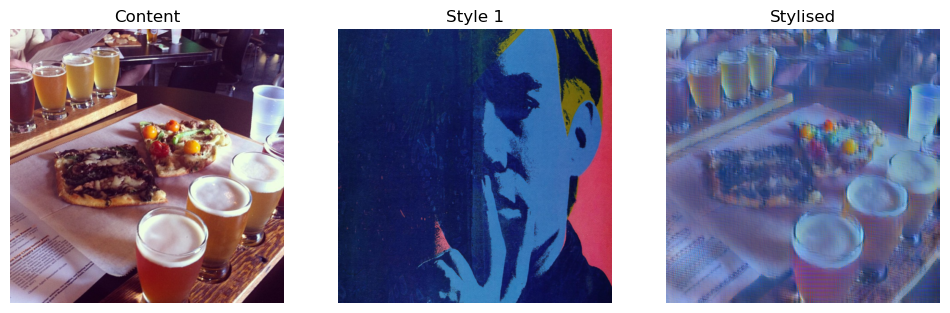

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.57, 99.59712499403395)


In [23]:
squeezeScore2,squeezeSpeed2 = analysis(snAdaIN,2,2)

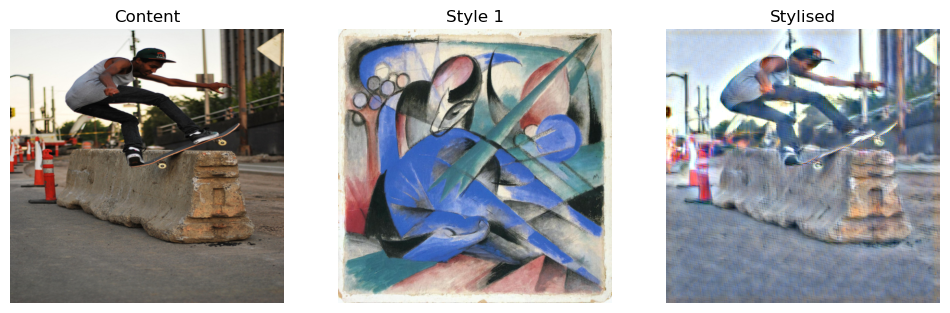

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.506, 93.36466700187884)


In [24]:
squeezeScore3,squeezeSpeed3 = analysis(snAdaIN,3,3)

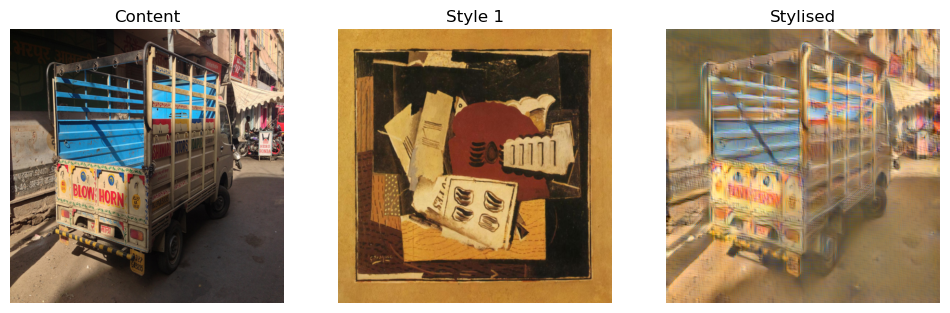

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.429, 95.17204199801199)


In [25]:
squeezeScore4,squeezeSpeed4 = analysis(snAdaIN,4,4)

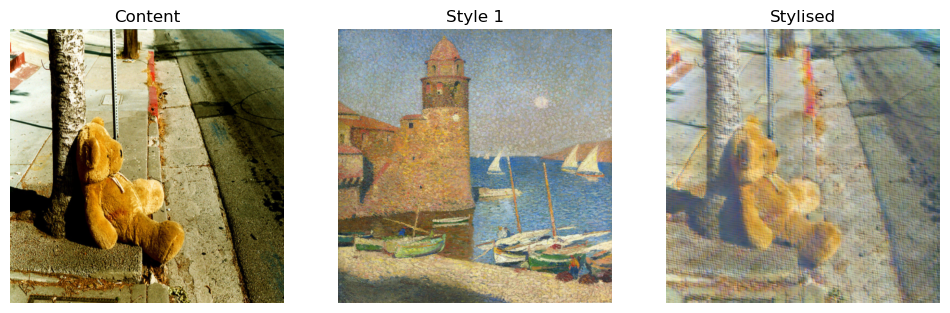

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.687, 94.92000000318512)


In [26]:
squeezeScore5,squeezeSpeed5 = analysis(snAdaIN,5,5)

## DenseNet

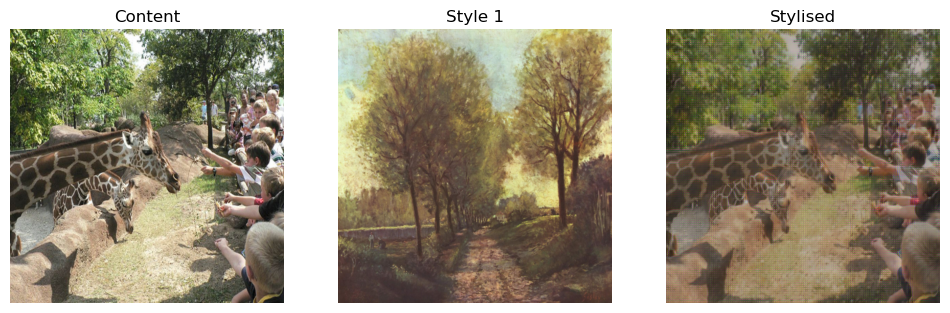

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.461, 426.12504100543447)


In [28]:
dn = densenet121(weights = DenseNet121_Weights.DEFAULT)
denseEncoder = nn.Sequential(*list(dn.features.children())[:7])

denseDecoder= nn.Sequential(    
            nn.ReflectionPad2d(1),
            nn.Conv2d(512, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),

            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 128, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(128, 128, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(128, 64, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(64, 64, 3),
            nn.ReLU(inplace=True),

            
            nn.ReflectionPad2d(1),
            nn.Conv2d(64, 3, 3),
    
        )

dnAdaIN = AdaIN(prebuild_decoder= "Model/dense_5.pth")
dnAdaIN.uploadEncoder(denseEncoder)
dnAdaIN.uploadDecoder(denseDecoder)
dnAdaIN.setup()

denseScore1,denseSpeed1 = analysis(dnAdaIN,1,1)

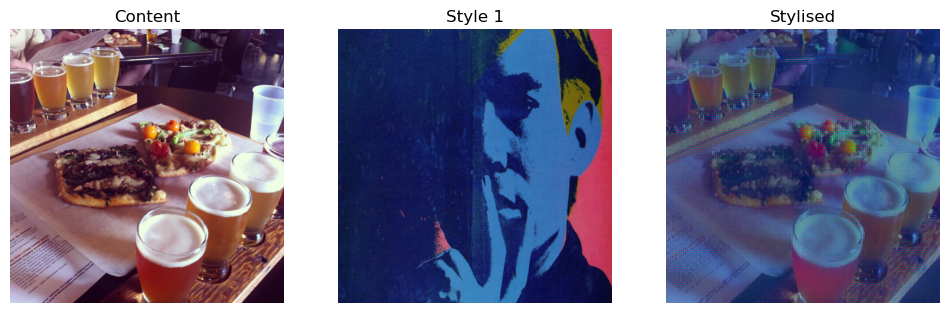

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.459, 177.79325001174584)


In [29]:
denseScore2,denseSpeed2 = analysis(dnAdaIN,2,2)

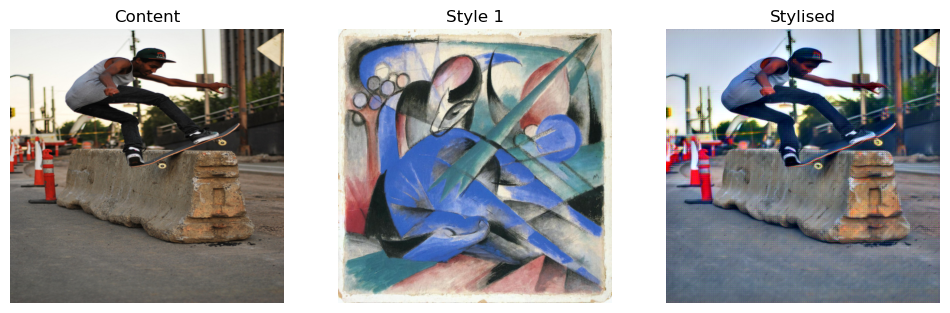

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.288, 187.1405839920044)


In [30]:
denseScore3,denseSpeed3 = analysis(dnAdaIN,3,3)

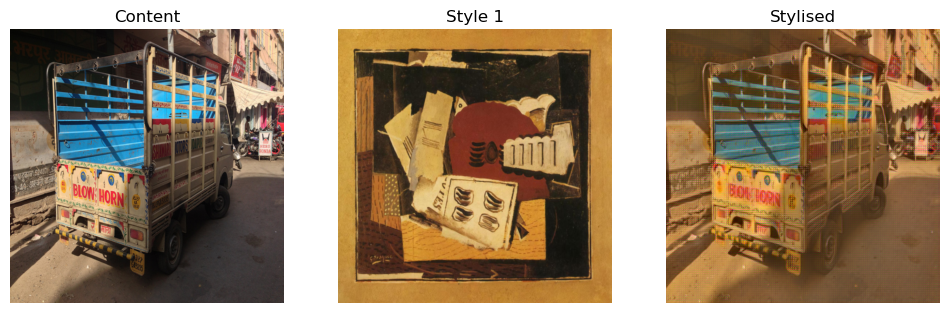

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.296, 185.48887499491684)


In [31]:
denseScore4,denseSpeed4 = analysis(dnAdaIN,4,4)

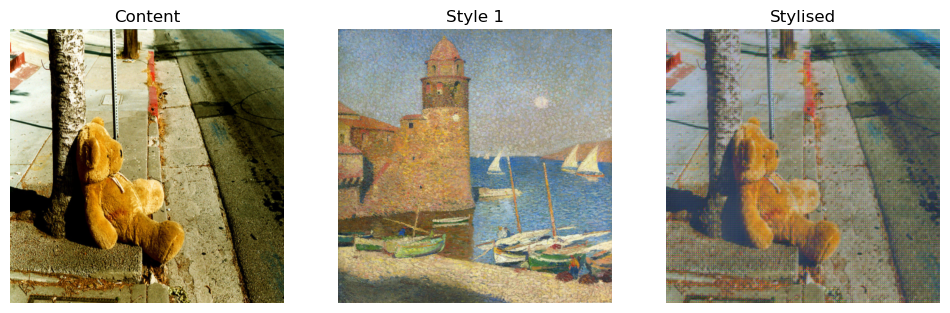

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.48, 194.03237500227988)


In [32]:
denseScore5,denseSpeed5 = analysis(dnAdaIN,5,5)

In [33]:
models = ["VGG-19", "Res50", "Res34", "SqueezeNet", "DenseNet"]
vggScore = np.array([defaultScore1,defaultScore2,defaultScore3,defaultScore4,defaultScore5], dtype=float)
vggTime = np.array([defaultSpeed1,defaultSpeed2,defaultSpeed3,defaultSpeed4,defaultSpeed5], dtype=float)
res50Score = np.array([res50Score1,res50Score2,res50Score3,res50Score4,res50Score5], dtype=float)
res50Time = np.array([res50Speed1,res50Speed2,res50Speed3,res50Speed4,res50Speed5], dtype=float)
res34Score = np.array([res34Score1,res34Score2,res34Score3,res34Score4,res34Score5], dtype=float)
res34Time = np.array([res34Speed1,res34Speed2,res34Speed3,res34Speed4,res34Speed5], dtype=float)
squeezeScore = np.array([squeezeScore1,squeezeScore2,squeezeScore3,squeezeScore4,squeezeScore5], dtype=float)
squeezeTime = np.array([squeezeSpeed1,squeezeSpeed2,squeezeSpeed3,squeezeSpeed4,squeezeSpeed5], dtype=float)
denseScore = np.array([denseScore1,denseScore2,denseScore3,denseScore4,denseScore5], dtype=float)
denseTime = np.array([denseSpeed1,denseSpeed2,denseSpeed3,denseSpeed4,denseSpeed5], dtype=float)

score_df = pd.DataFrame({
    "Model": models,
    "AvgProcessingTime(sec)": np.round(np.array([np.mean(vggTime), np.mean(res50Time), np.mean(res34Time), np.mean(squeezeTime), np.mean(denseTime)]) / 1000, 2),
    "LPIPS_ContentRetention": np.round(np.array([np.mean(vggScore), np.mean(res50Score), np.mean(res34Score), np.mean(squeezeScore), np.mean(denseScore)]), 3),
    "Comment": np.array(["Good", "Good", "Grainy Look", "Blurry", "Good"])
})

score_df

,Model,AvgProcessingTime(sec),LPIPS_ContentRetention,Comment
0,VGG-19,0.25,0.384,Good
1,Res50,0.16,0.380,Good
2,Res34,0.11,0.522,Grainy Look
3,SqueezeNet,0.10,0.567,Blurry
4,DenseNet,0.23,0.397,Good


Text(0.5, 0, 'Runtime(sec)')

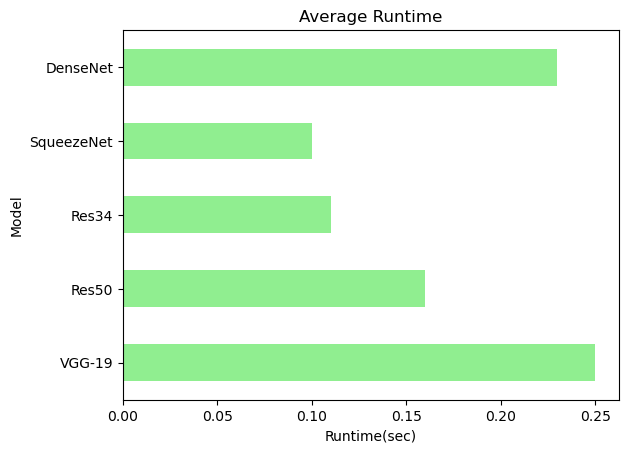

In [34]:
score_df.plot(y="AvgProcessingTime(sec)", x="Model", kind="barh", legend=False, color="lightgreen")
plt.title("Average Runtime")
plt.xlabel("Runtime(sec)")